# Exploratory Data Analysis for WATER DEMAND

용수공급량 예측을 위한 방향성에는 크게 두가지가 있음
- 각 지자체마다 개별 모델을 생성 (시계열)
- 전체 지자체를 포함하는 일반 모형 (꼭 시계열이 아니어도 됨)

## 1. Load Required Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams
import sklearn
import warnings
warnings.filterwarnings("ignore")

sns.set(font_scale = 0.7)
plt.rcParams['axes.unicode_minus'] = False

## 2. Load Data

['서울특별시', '세종특별자치시', '부산광역시', '대구광역시', '인천광역시', '광주광역시', '대전광역시', '울산광역시']
[Seoul, Sejong, Busan, Daegu, Incheon, Gwangju, Daejeon, Ulsan]

In [2]:
folder_name = '특광역시'
CITY_NAME_Kor = '서울특별시'
CITY_NAME_Eng = 'Seoul'

### 2.1 Load Predictor (Independent) Variables

In [3]:
predictor_raw = pd.read_excel("../data/영향분석/시군별_영향인자(독립변수)/특광역시/특별시 및 광역시 종합.xlsx", sheet_name=CITY_NAME_Kor)
col_name = predictor_raw.iloc[2].values
predictor_raw1 = predictor_raw.iloc[3:, :29] # header 및 일단위자료 삭제
predictor_raw1.columns = col_name[:29]
predictor_raw1_len = predictor_raw1['연도'].isna().argmax()
predictor_raw1 = predictor_raw1[:predictor_raw1_len]
predictor_raw1.index = pd.to_datetime(predictor_raw1['연도'][:predictor_raw1_len].astype(str) + '-' + predictor_raw1['월'][:predictor_raw1_len].astype(str))
predictor_raw1.rename_axis(columns='', inplace=True)
predictor_raw1.drop(columns=['연도', '월'], inplace=True)
predictor_raw1.index.name = "date"
predictor_raw1 = predictor_raw1.astype(float)
predictor_raw1.head()

,총인구수(명),세대수(개),세대당 인구(명),남자 인구수(명),여자 인구수(명),남여 비율(남/여),65세 이상\n고령화비율(%),전력사용량(kWh),산업체 수(개),산업체 규모(개)\n100인 이상 사업장,...,취업률\n고용보험자 비율\n(피보험자/총인구),취약계층(개)\n장애인포함가구,취약계층(비율)\n장애인포함가구,평균 기온(°C),월합강수량(mm),습도\n평균상대습도(%),일조량\n합계 일조시간(hr),지중온도\n평균지면온도(°C),풍량\n평균풍속(m/s),기압\n평균현지기압(hPa)
date,,,,,,,,,,,,,,,,,,,,,
2001-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,-4.1,39.4,62.0,97.0,-3.6,2.2,1012.9
2001-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,-0.3,45.7,60.0,117.0,-0.2,2.1,1013.3
2001-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,5.0,18.1,51.0,151.0,5.4,2.8,1004.8
2001-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,13.6,12.3,50.0,177.8,15.4,2.5,1005.1
2001-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,19.1,16.5,61.0,163.1,22.7,2.1,1000.2


In [4]:
predictor_raw1.columns = ['Total_Population', 'Households', 'Population_per_Households', 'Male_Population', 'Female_Population', 'Male_Female_Ratio', 'Population_aging_Ratio', 
                'Power_usage', 'Num_of_Business', 'Business_above_100', 'complex_area', 'annual_household_income',
                'High_School_Graduate_num', 'High_School_Graduate_ratio', 'personal_expense', 'benefits_vs_personal_expense', 'employment_ratio', 'employment_insurance_ratio', 'vulnerable_class', 'vulnerable_class_ratio',
                'Temp', 'Rainfall', 'Humidity', 'Solar_radiation', 'Ground_Temp', 'Wind', 'Pressure']
predictor_raw1.head()

,Total_Population,Households,Population_per_Households,Male_Population,Female_Population,Male_Female_Ratio,Population_aging_Ratio,Power_usage,Num_of_Business,Business_above_100,...,employment_insurance_ratio,vulnerable_class,vulnerable_class_ratio,Temp,Rainfall,Humidity,Solar_radiation,Ground_Temp,Wind,Pressure
date,,,,,,,,,,,,,,,,,,,,,
2001-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,-4.1,39.4,62.0,97.0,-3.6,2.2,1012.9
2001-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,-0.3,45.7,60.0,117.0,-0.2,2.1,1013.3
2001-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,5.0,18.1,51.0,151.0,5.4,2.8,1004.8
2001-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,13.6,12.3,50.0,177.8,15.4,2.5,1005.1
2001-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,19.1,16.5,61.0,163.1,22.7,2.1,1000.2


In [5]:
predictor_f = predictor_raw1.loc["2017-01-01":"2021-12-01"]
predictor_f.head()

,Total_Population,Households,Population_per_Households,Male_Population,Female_Population,Male_Female_Ratio,Population_aging_Ratio,Power_usage,Num_of_Business,Business_above_100,...,employment_insurance_ratio,vulnerable_class,vulnerable_class_ratio,Temp,Rainfall,Humidity,Solar_radiation,Ground_Temp,Wind,Pressure
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,9930478.0,4192985.0,2.368355,4875745.0,5054733.0,0.964590,13.1,4.416889e+09,476774.0,5179.0,...,0.407796,59247.0,0.014130,-1.8,14.9,55.0,209.0,-0.7,2.3,1014.7
2017-02-01,9931412.0,4200761.0,2.364194,4874839.0,5056573.0,0.964060,13.2,4.127699e+09,468721.0,5148.0,...,0.411018,59275.0,0.014111,-0.2,11.1,54.0,210.0,1.0,2.4,1012.6
2017-03-01,9926968.0,4202888.0,2.361940,4871560.0,5055408.0,0.963633,13.3,3.582654e+09,470722.0,5287.0,...,0.411362,59372.0,0.014126,6.3,7.9,48.0,255.2,8.1,2.4,1009.0
2017-04-01,9922745.0,4203957.0,2.360335,4868367.0,5054378.0,0.963198,13.3,3.591552e+09,472938.0,5329.0,...,0.415280,59516.0,0.014157,13.9,61.6,52.0,259.7,16.9,2.6,1002.6
2017-05-01,9919016.0,4207393.0,2.357521,4865778.0,5053238.0,0.962903,13.4,3.419987e+09,473675.0,5323.0,...,0.416158,59551.0,0.014154,19.5,16.1,52.0,301.5,25.0,2.4,1002.0


### 2.2 Load Response (Dependent) Variable: 용수공급량 ("월별 공급량/월별 일수"를 통해 m3/day으로 평균하여 표현)

In [6]:
response_raw = pd.read_excel("../data/영향분석/가뭄DB 시군별 일평균 공급량(17-21).xlsx", header=1)
response_raw['date'] = response_raw["지자체명"].values
response_raw = response_raw.iloc[1:, 1:]
response_raw[f'water_supply({CITY_NAME_Eng})'] = response_raw[CITY_NAME_Kor].values
response_raw = response_raw[["date", f'water_supply({CITY_NAME_Eng})']]
response_raw.set_index("date", inplace=True)
response_raw = response_raw.astype(float)
response_raw.head()

,water_supply(Seoul)
date,
2017-01,3.007799e+06
2017-02,3.029100e+06
2017-03,3.064747e+06
2017-04,3.117700e+06
2017-05,3.189195e+06


In [7]:
response_f = response_raw.loc["2017-01":"2021-12"]
response_f.head()

,water_supply(Seoul)
date,
2017-01,3.007799e+06
2017-02,3.029100e+06
2017-03,3.064747e+06
2017-04,3.117700e+06
2017-05,3.189195e+06


In [8]:
dataset = predictor_f
dataset[f"water_supply({CITY_NAME_Eng})"] = response_f[f"water_supply({CITY_NAME_Eng})"].values
dataset.head()

,Total_Population,Households,Population_per_Households,Male_Population,Female_Population,Male_Female_Ratio,Population_aging_Ratio,Power_usage,Num_of_Business,Business_above_100,...,vulnerable_class,vulnerable_class_ratio,Temp,Rainfall,Humidity,Solar_radiation,Ground_Temp,Wind,Pressure,water_supply(Seoul)
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,9930478.0,4192985.0,2.368355,4875745.0,5054733.0,0.964590,13.1,4.416889e+09,476774.0,5179.0,...,59247.0,0.014130,-1.8,14.9,55.0,209.0,-0.7,2.3,1014.7,3.007799e+06
2017-02-01,9931412.0,4200761.0,2.364194,4874839.0,5056573.0,0.964060,13.2,4.127699e+09,468721.0,5148.0,...,59275.0,0.014111,-0.2,11.1,54.0,210.0,1.0,2.4,1012.6,3.029100e+06
2017-03-01,9926968.0,4202888.0,2.361940,4871560.0,5055408.0,0.963633,13.3,3.582654e+09,470722.0,5287.0,...,59372.0,0.014126,6.3,7.9,48.0,255.2,8.1,2.4,1009.0,3.064747e+06
2017-04-01,9922745.0,4203957.0,2.360335,4868367.0,5054378.0,0.963198,13.3,3.591552e+09,472938.0,5329.0,...,59516.0,0.014157,13.9,61.6,52.0,259.7,16.9,2.6,1002.6,3.117700e+06
2017-05-01,9919016.0,4207393.0,2.357521,4865778.0,5053238.0,0.962903,13.4,3.419987e+09,473675.0,5323.0,...,59551.0,0.014154,19.5,16.1,52.0,301.5,25.0,2.4,1002.0,3.189195e+06


## 3. Check Data Availability

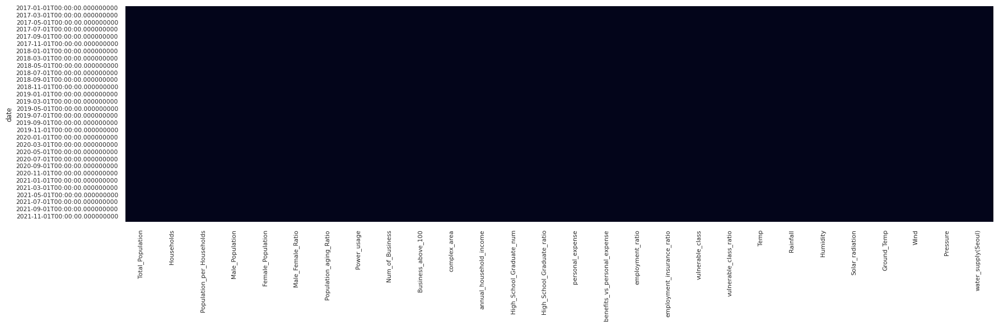

In [9]:
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(dataset.isnull(), cbar=False)
sns.set(font_scale = 2.0)
plt.show()

## 4. Plot All Variables

[]

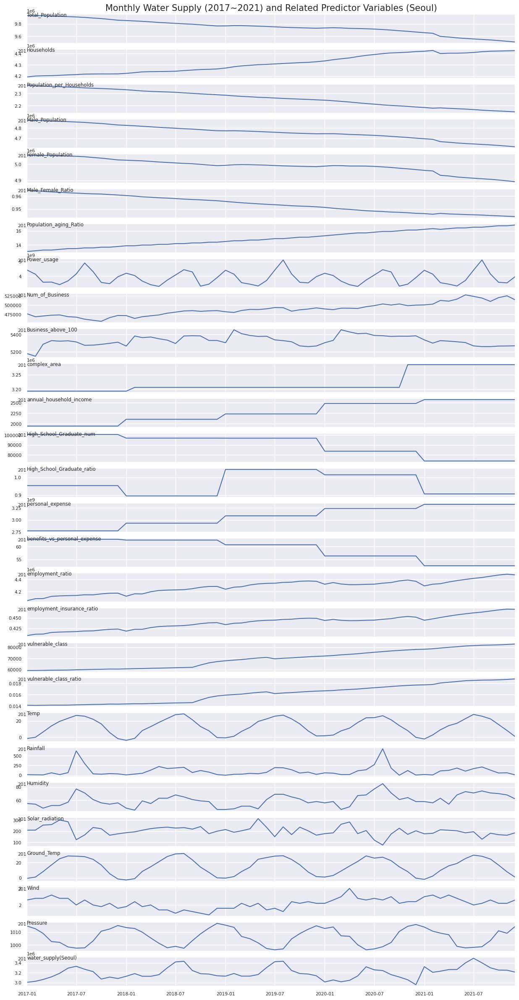

In [10]:
rcParams['figure.figsize'] = 15, 30
fig1 = plt.figure()
values = dataset.values
sns.set(font_scale = 0.7)
groups = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27]
i = 1
# plot each column
for group in groups:
    plt.subplot(len(groups), 1, i)
    if group == 0:
        plt.title(f"Monthly Water Supply (2017~2021) and Related Predictor Variables ({CITY_NAME_Eng})", fontsize=15)
    plt.plot(dataset.index,  values[:, group])
    plt.title(dataset.columns[group], y=0.8, loc='left')
    plt.grid(True)
    plt.xlim([dataset.index[0], dataset.index[-1]])
    i += 1
filename = CITY_NAME_Eng+"_all_variables_plot.png"
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.plot()  

## 5. Correlation (Categories: 1. Seasonality, 2. Locality, 3. Sociality)

### 5.1  Sesonality Features
 #### (1) Temp, (2) Rainfall, (3) Humidity, (4) Solar_radiation, (5) Ground_Temp, (6) Wind, (7) Pressure

- 기온&지중온도는 0.4의 유의미한 양의 상관성
- 기압은 -0.4정도의 역상관성
- 애초에 기온과 지중온도는 0.99의 상관성을 가지며, 기압 또한 (기온, 지중온도와 -0.9의 상관성을 가짐)
    - 동일한 변수로 보아도 무방함

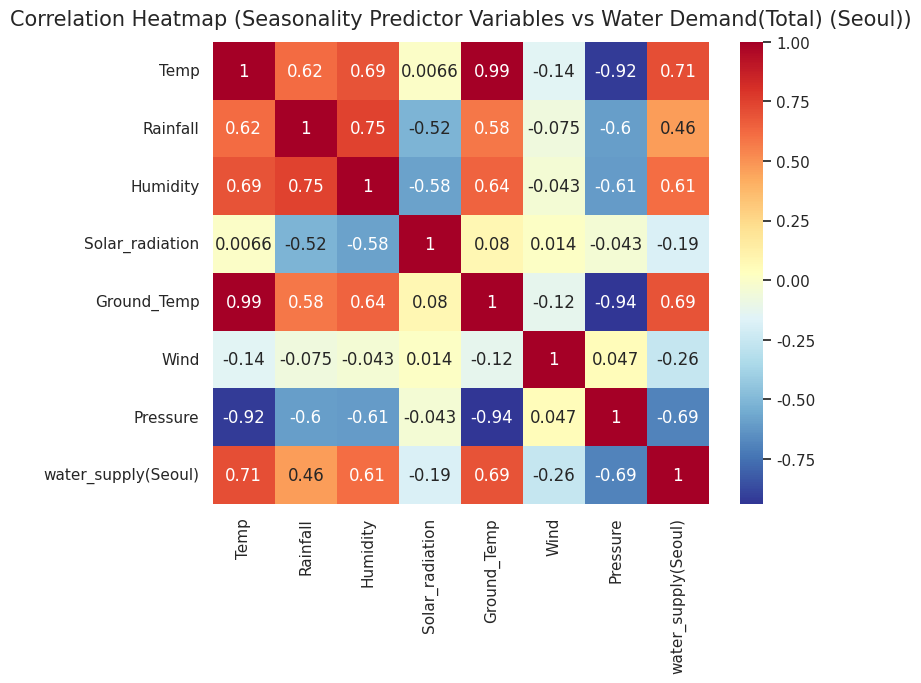

In [11]:
cols_seasonality =['Temp', 'Rainfall', 'Humidity', 'Solar_radiation', 'Ground_Temp', 'Wind', 'Pressure', f"water_supply({CITY_NAME_Eng})"]
plt.figure(figsize=(8, 6))
sns.set(font_scale = 1.0)
dataset[cols_seasonality].corr()
heatmap = sns.heatmap(dataset[cols_seasonality].corr(), cmap="RdYlBu_r", annot=True, annot_kws={"fontsize":12})
heatmap.set_title(f'Correlation Heatmap (Seasonality Predictor Variables vs Water Demand(Total) ({CITY_NAME_Eng}))', fontsize=15, pad=12)
filename = CITY_NAME_Eng+"_seasonality_predictor_vs_water_demand_total.png"
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.show()

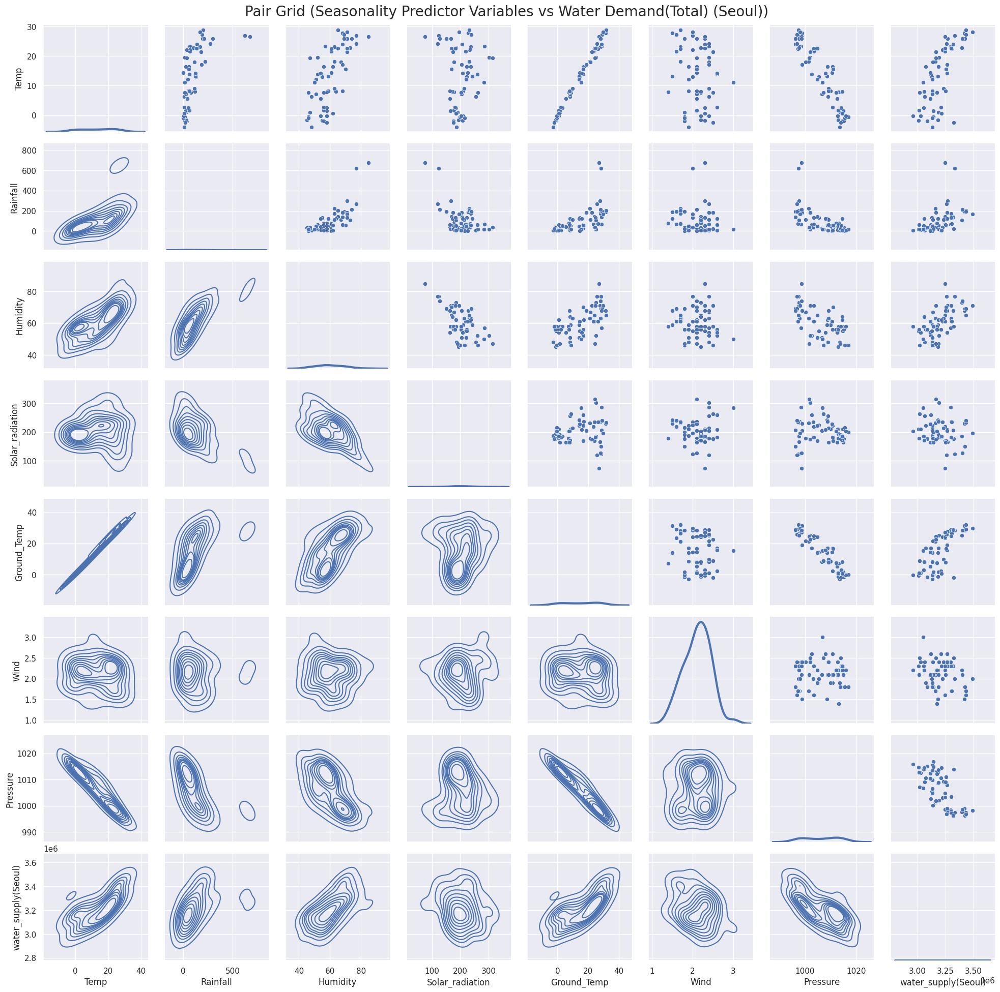

In [12]:
g = sns.PairGrid(dataset[cols_seasonality])
g.fig.subplots_adjust(top=0.96)
g.fig.suptitle(f'Pair Grid (Seasonality Predictor Variables vs Water Demand(Total) ({CITY_NAME_Eng}))', fontsize=20)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)
plt.savefig(f"./{folder_name}/" + CITY_NAME_Eng+"_seasonality_predictor_vs_water_demand_total_pair_grid.png", bbox_inches='tight')

### 5.2  Locality Features 
#### 'Total_Population', 'Households', 'Population_per_Households', 'Male_Population', 'Female_Population', 'Male_Female_Ratio',                                     'Population_aging_Ratio', 'Power_usage', 'Num_of_Business', 'Business_above_100', 'complex_area'

- 인구수(총인구, 세대당인구, 남자인구, 여자인구, 남여비율)과 0.6의 상관성 
    - 인구수는 서로 1에 가까운 상관성을 가짐 (공선성)
    - 세대수는 왜 -1에 가깝지??...
- 세대수, 고령화비율, 산업 관련3개 인자와는 -0.44 ~ -0.48의 상관성을 가짐
    - 산업체 관련 입력변수는 유사한 음의 상관성을 갖지만 서로 영향이 별로 없음

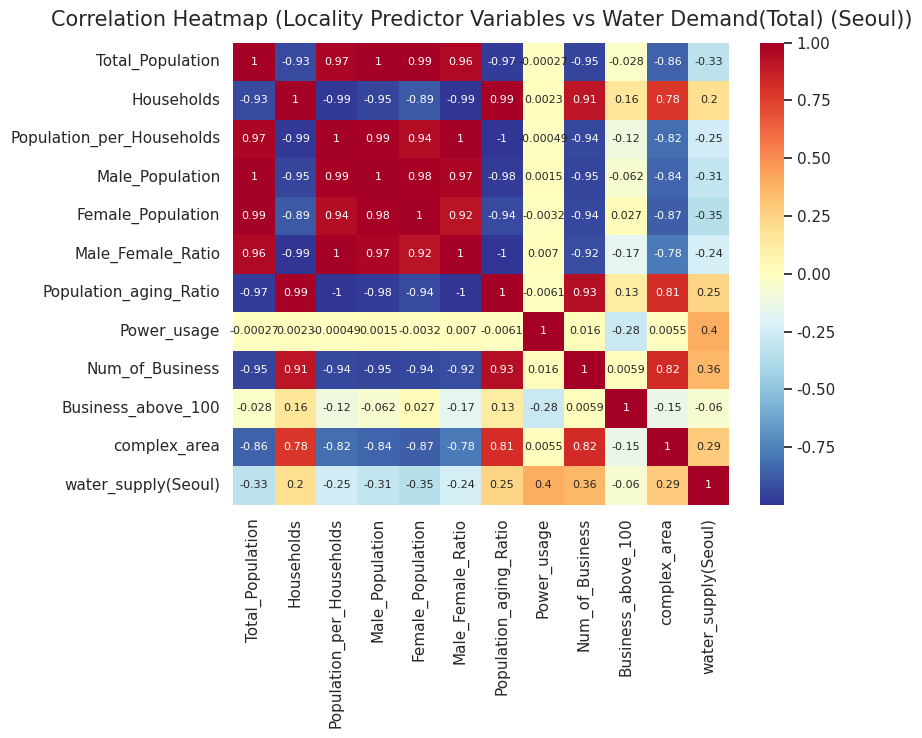

In [13]:
cols_locality =['Total_Population', 'Households', 'Population_per_Households', 'Male_Population', 'Female_Population', 'Male_Female_Ratio', 
                'Population_aging_Ratio', 'Power_usage', 'Num_of_Business', 'Business_above_100', 'complex_area', f"water_supply({CITY_NAME_Eng})"]
plt.figure(figsize=(8, 6))
sns.set(font_scale = 1.0)
dataset[cols_locality].corr()
heatmap = sns.heatmap(dataset[cols_locality].corr(), cmap="RdYlBu_r", annot=True, annot_kws={"fontsize":8})
heatmap.set_title(f'Correlation Heatmap (Locality Predictor Variables vs Water Demand(Total) ({CITY_NAME_Eng}))', fontsize=15, pad=12)
filename = CITY_NAME_Eng+"_locality_predictor_vs_water_demand_total.png"
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.show()

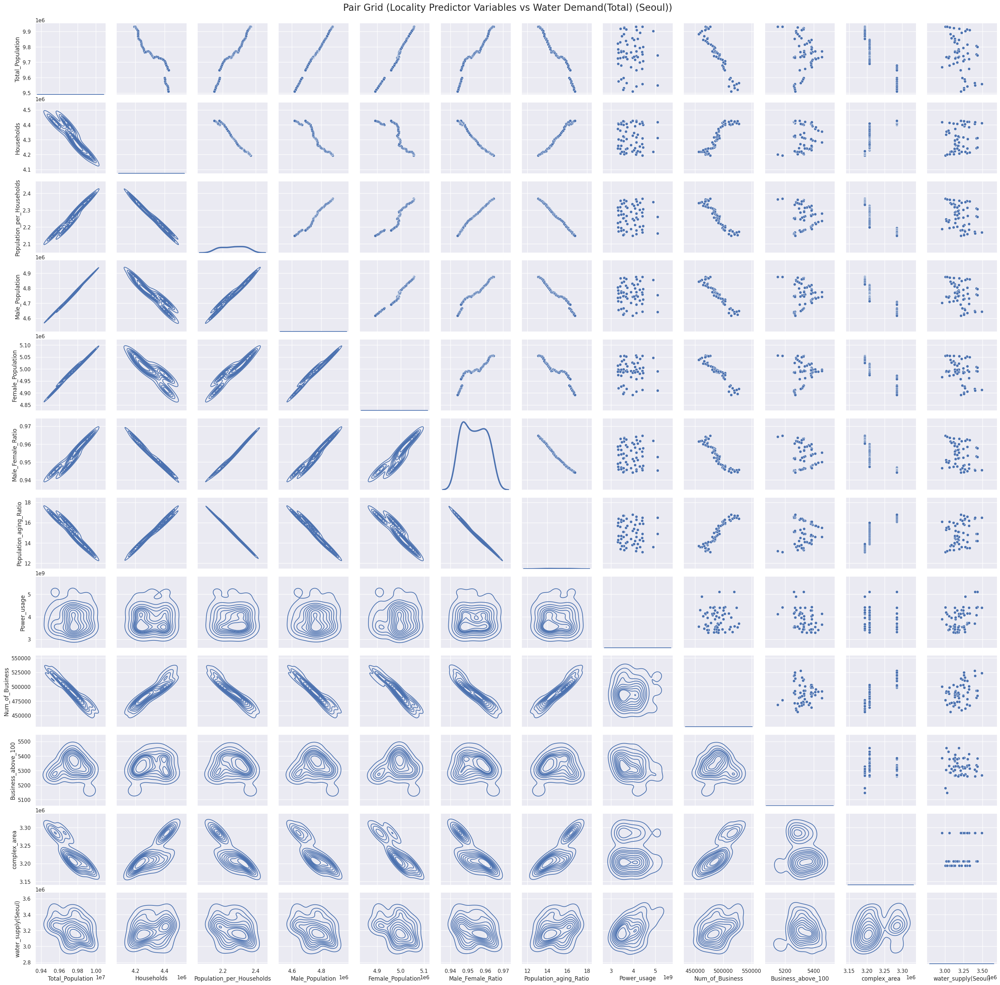

In [14]:
g = sns.PairGrid(dataset[cols_locality])
g.fig.subplots_adjust(top=0.96)
g.fig.suptitle(f'Pair Grid (Locality Predictor Variables vs Water Demand(Total) ({CITY_NAME_Eng}))', fontsize=20)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)
plt.savefig(f"./{folder_name}/" + CITY_NAME_Eng+"_locality_predictor_vs_water_demand_total_pair_grid.png", bbox_inches='tight')

### 5.3  Sociality Features 
#### 'annual_household_income', 'High_School_Graduate_num', 'High_School_Graduate_ratio', 'personal_expense', 'benefits_vs_personal_expense', 'employment_ratio', 'employment_insurance_ratio', 'vulnerable_class', 'vulnerable_class_ratio'

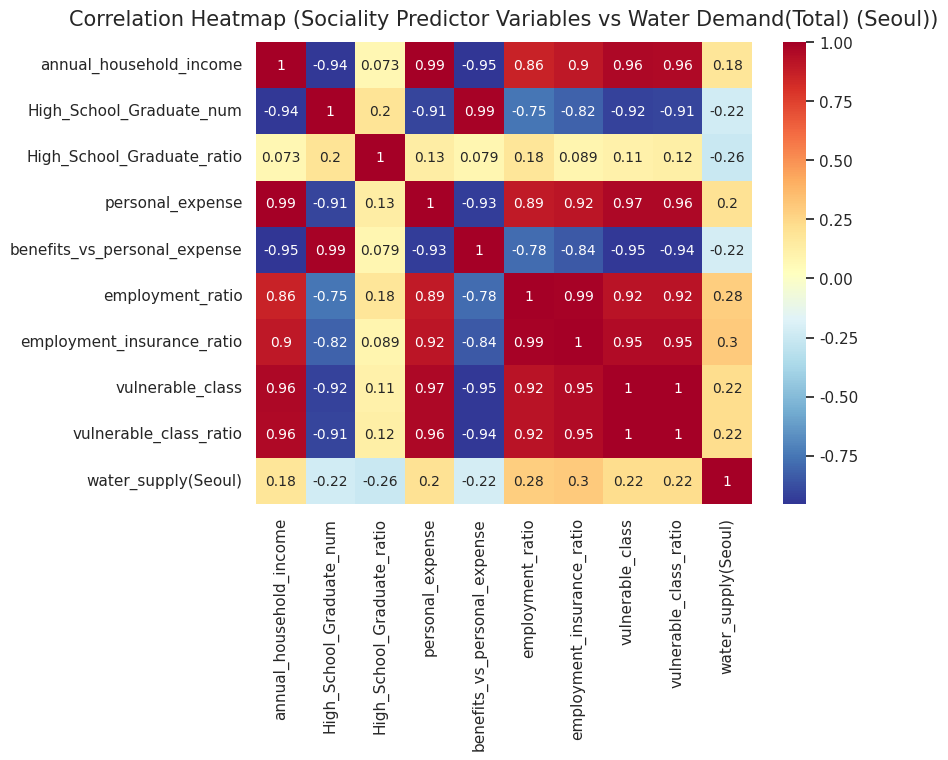

In [15]:
cols_sociality =['annual_household_income', 'High_School_Graduate_num', 'High_School_Graduate_ratio', 'personal_expense', 'benefits_vs_personal_expense', 
                 'employment_ratio', 'employment_insurance_ratio', 'vulnerable_class', 'vulnerable_class_ratio', f"water_supply({CITY_NAME_Eng})"]
plt.figure(figsize=(8, 6))
sns.set(font_scale = 1.0)
dataset[cols_sociality].corr()
heatmap = sns.heatmap(dataset[cols_sociality].corr(), cmap="RdYlBu_r", annot=True, annot_kws={"fontsize":10})
heatmap.set_title(f'Correlation Heatmap (Sociality Predictor Variables vs Water Demand(Total) ({CITY_NAME_Eng}))', fontsize=15, pad=12)
filename = CITY_NAME_Eng+"_sociality_predictor_vs_water_demand_total.png"
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.show()

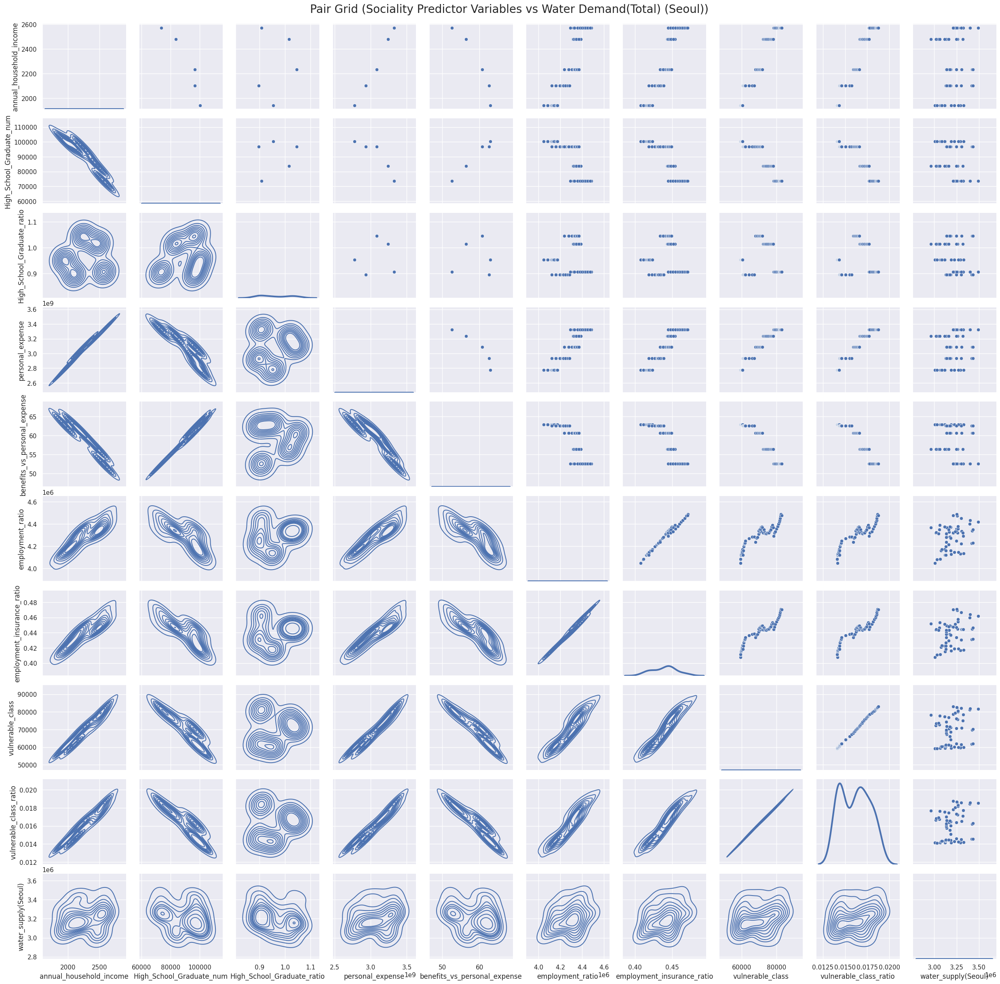

In [16]:
g = sns.PairGrid(dataset[cols_sociality])
g.fig.subplots_adjust(top=0.96)
g.fig.suptitle(f'Pair Grid (Sociality Predictor Variables vs Water Demand(Total) ({CITY_NAME_Eng}))', fontsize=20)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)
plt.savefig(f"./{folder_name}/" + CITY_NAME_Eng+"_sociality_predictor_vs_water_demand_total_pair_grid.png", bbox_inches='tight')

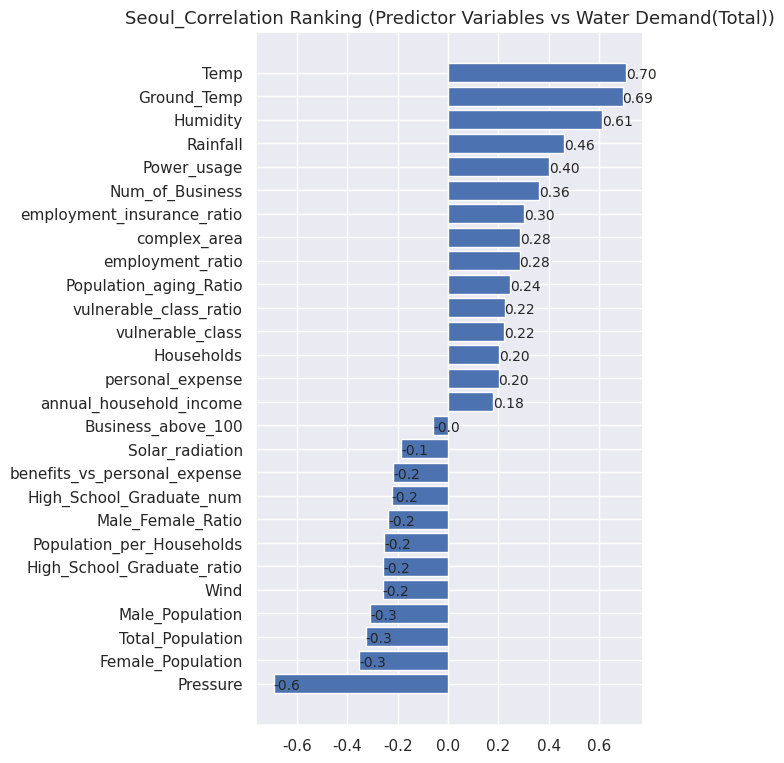

In [17]:
data_corr = pd.concat([dataset[cols_seasonality].corr()[-1:].T[:-1], dataset[cols_locality].corr()[-1:].T[:-1], dataset[cols_sociality].corr()[-1:].T[:-1]])
data_corr.columns = [f'{CITY_NAME_Eng}_Correlation']
data_corr.sort_values(by=f'{CITY_NAME_Eng}_Correlation', ascending=True, inplace=True)
fig, ax = plt.subplots(figsize=(5,9))
ax.barh(data_corr.index, data_corr[f'{CITY_NAME_Eng}_Correlation'].values)
for i, v in enumerate(data_corr[f'{CITY_NAME_Eng}_Correlation']):
    ax.text(v, i-0.25, str(v)[0:4], fontsize=10)
    
filename = CITY_NAME_Eng+"_Correlation Ranking (Predictor Variables vs Water Demand(Total)).png"
plt.title(f'{filename.split(".")[0]}', fontsize=13)
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.show()    
data_corr.to_csv(f"./{folder_name}/" + f'{filename.split(".")[0]}.csv')

## 6. Data Decomposition

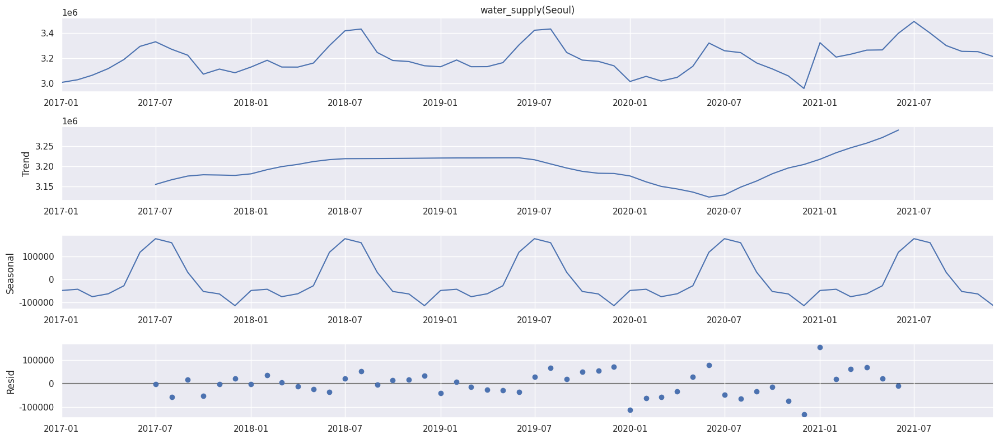

In [18]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(dataset[f"water_supply({CITY_NAME_Eng})"], model='additive') #multiplicative

rcParams['figure.figsize'] = 18, 8
result.plot().savefig(f"./{folder_name}/" + CITY_NAME_Eng+"_data_decomposition.png")

In [19]:
dataset["trend"] = result.trend.values
dataset["seasonal"] = result.seasonal.values
dataset["resid"] = result.resid.values
dataset.to_csv(f"./{folder_name}/" + f'{CITY_NAME_Eng}_datasets.csv')

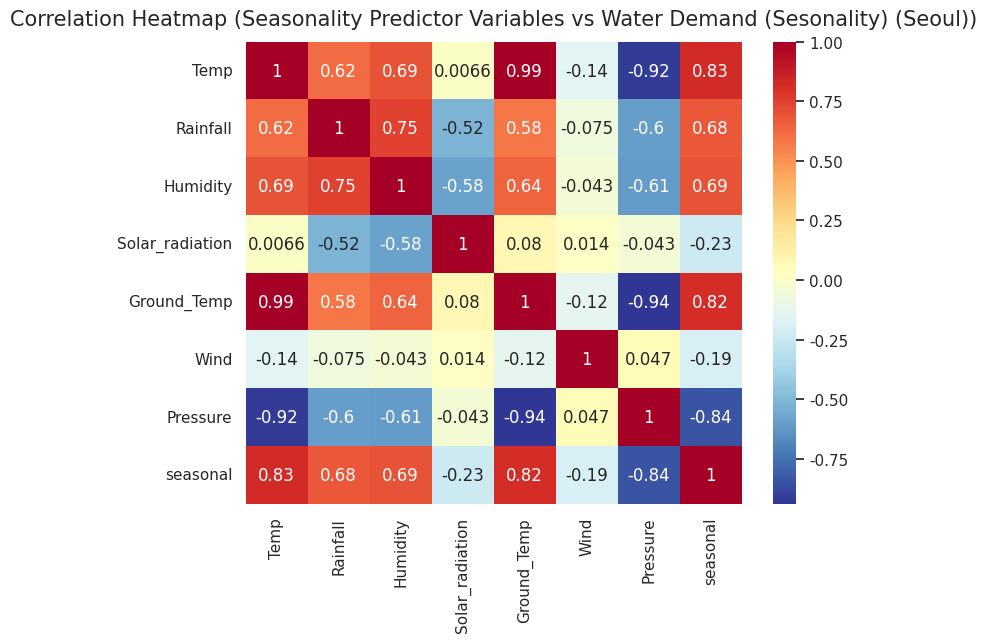

In [20]:
cols_seasonality =['Temp', 'Rainfall', 'Humidity', 'Solar_radiation', 'Ground_Temp', 'Wind', 'Pressure', 'seasonal']
plt.figure(figsize=(8, 6))
sns.set(font_scale = 1.0)
dataset[cols_seasonality].corr()
heatmap = sns.heatmap(dataset[cols_seasonality].corr(), cmap="RdYlBu_r", annot=True, annot_kws={"fontsize":12})
heatmap.set_title(f'Correlation Heatmap (Seasonality Predictor Variables vs Water Demand (Sesonality) ({CITY_NAME_Eng}))', fontdict={'fontsize':15}, pad=12)
filename = CITY_NAME_Eng+"_seasonality_predictor_vs_water_demand (seasonality).png"
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.show()

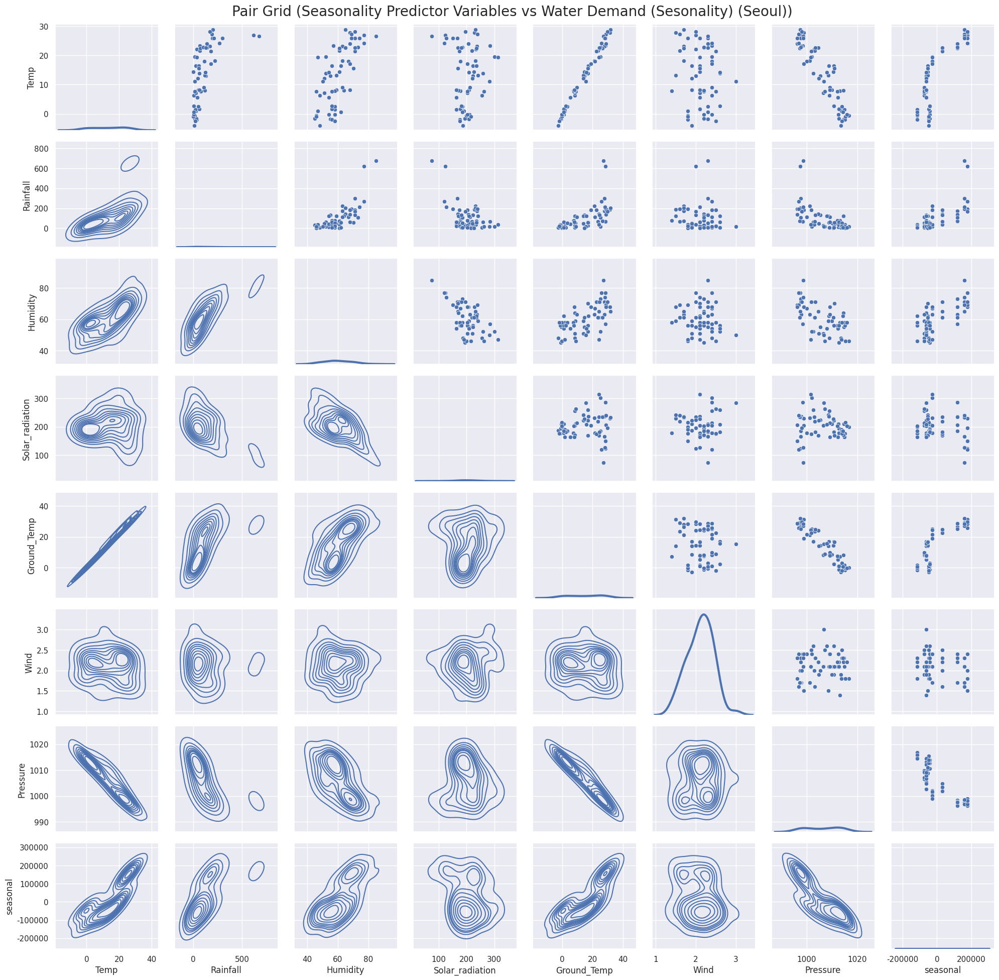

In [21]:
g = sns.PairGrid(dataset[cols_seasonality])
g.fig.subplots_adjust(top=0.96)
g.fig.suptitle(f'Pair Grid (Seasonality Predictor Variables vs Water Demand (Sesonality) ({CITY_NAME_Eng}))', fontsize=20)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)
plt.savefig(f"./{folder_name}/" + CITY_NAME_Eng+"_seasonality_predictor_vs_water_demand (seasonality)_pair_grid.png", bbox_inches='tight')

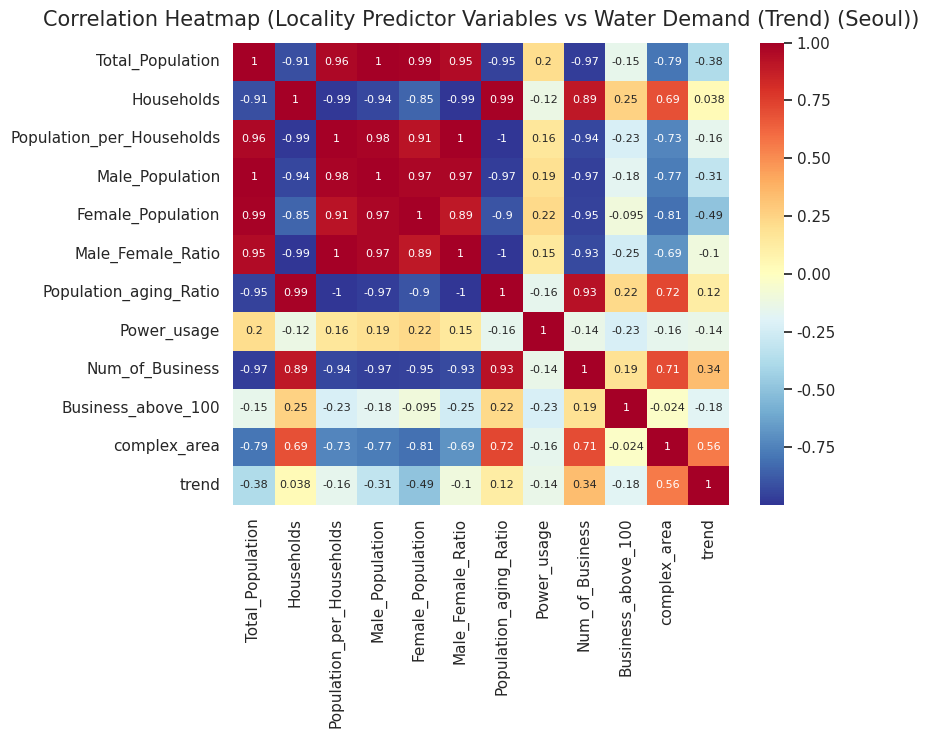

In [22]:
cols_locality =['Total_Population', 'Households', 'Population_per_Households', 'Male_Population', 'Female_Population', 'Male_Female_Ratio', 
                'Population_aging_Ratio', 'Power_usage', 'Num_of_Business', 'Business_above_100', 'complex_area', 'trend']
plt.figure(figsize=(8, 6))
sns.set(font_scale = 1.0)
example1 = dataset[cols_locality].loc["2017-07-01":"2021-06-01"]
heatmap = sns.heatmap(example1.corr(), cmap="RdYlBu_r", annot=True, annot_kws={"fontsize":8})
heatmap.set_title(f'Correlation Heatmap (Locality Predictor Variables vs Water Demand (Trend) ({CITY_NAME_Eng}))', fontdict={'fontsize':15}, pad=12)
filename = CITY_NAME_Eng+"_locality_predictor_vs_water_demand (trend).png"
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.show()

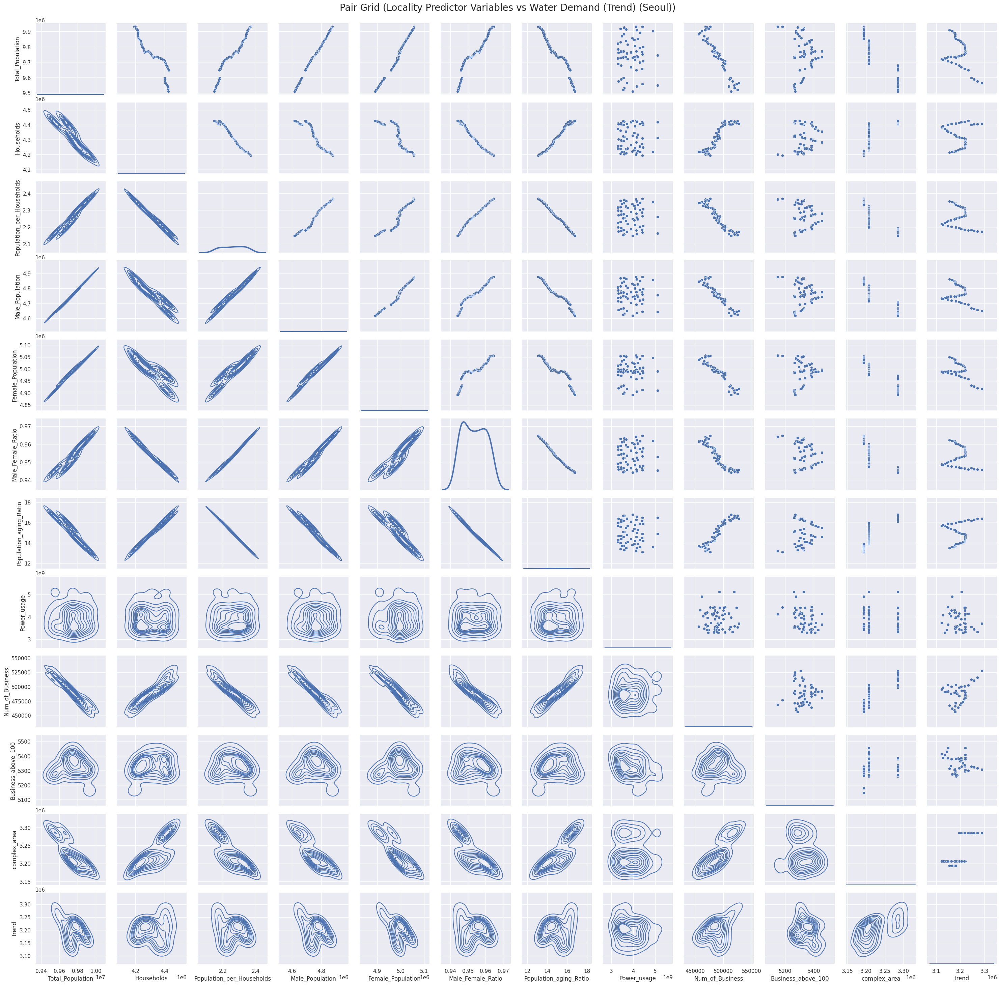

In [23]:
g = sns.PairGrid(dataset[cols_locality])
g.fig.subplots_adjust(top=0.96)
g.fig.suptitle(f'Pair Grid (Locality Predictor Variables vs Water Demand (Trend) ({CITY_NAME_Eng}))', fontsize=20)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)
plt.savefig(f"./{folder_name}/" + CITY_NAME_Eng+"_locality_predictor_vs_water_demand (trend)_pair_grid.png", bbox_inches='tight')

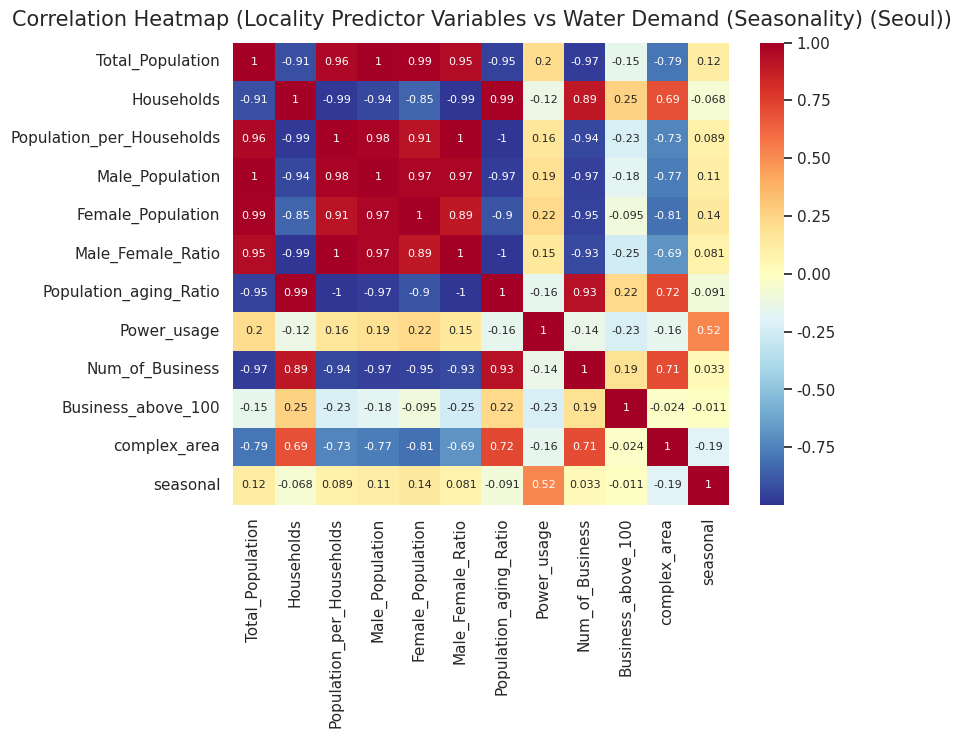

In [24]:
cols_locality =['Total_Population', 'Households', 'Population_per_Households', 'Male_Population', 'Female_Population', 'Male_Female_Ratio', 
                'Population_aging_Ratio', 'Power_usage', 'Num_of_Business', 'Business_above_100', 'complex_area', 'seasonal']
plt.figure(figsize=(8, 6))
sns.set(font_scale = 1.0)
example2 = dataset[cols_locality].loc["2017-07-01":"2021-06-01"]
heatmap = sns.heatmap(example2.corr(), cmap="RdYlBu_r", annot=True, annot_kws={"fontsize":8})
heatmap.set_title(f'Correlation Heatmap (Locality Predictor Variables vs Water Demand (Seasonality) ({CITY_NAME_Eng}))', fontdict={'fontsize':15}, pad=12)
filename = CITY_NAME_Eng+"_locality_predictor_vs_water_demand (seasonality).png"
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.show()

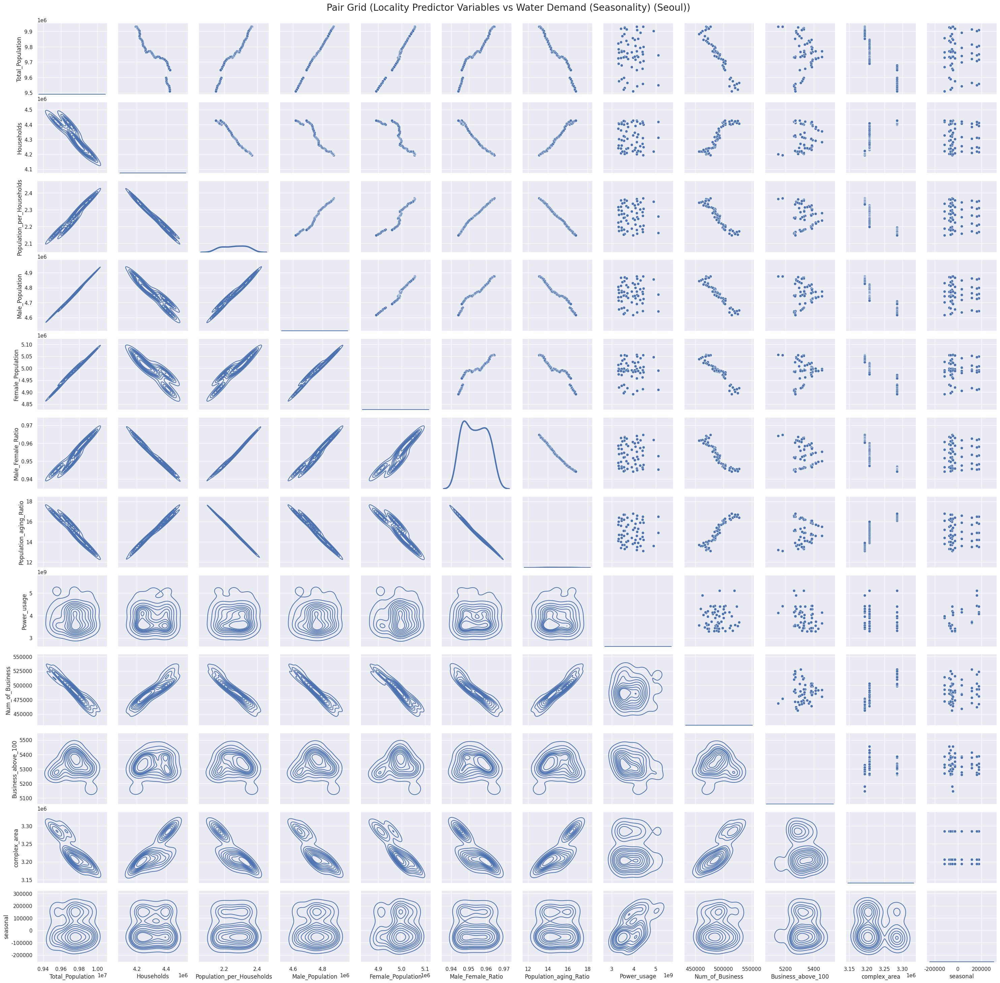

In [25]:
g = sns.PairGrid(dataset[cols_locality])
g.fig.subplots_adjust(top=0.96)
g.fig.suptitle(f'Pair Grid (Locality Predictor Variables vs Water Demand (Seasonality) ({CITY_NAME_Eng}))', fontsize=20)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)
plt.savefig(f"./{folder_name}/" + CITY_NAME_Eng+"_locality_predictor_vs_water_demand (seasonality)_pair_grid.png", bbox_inches='tight')

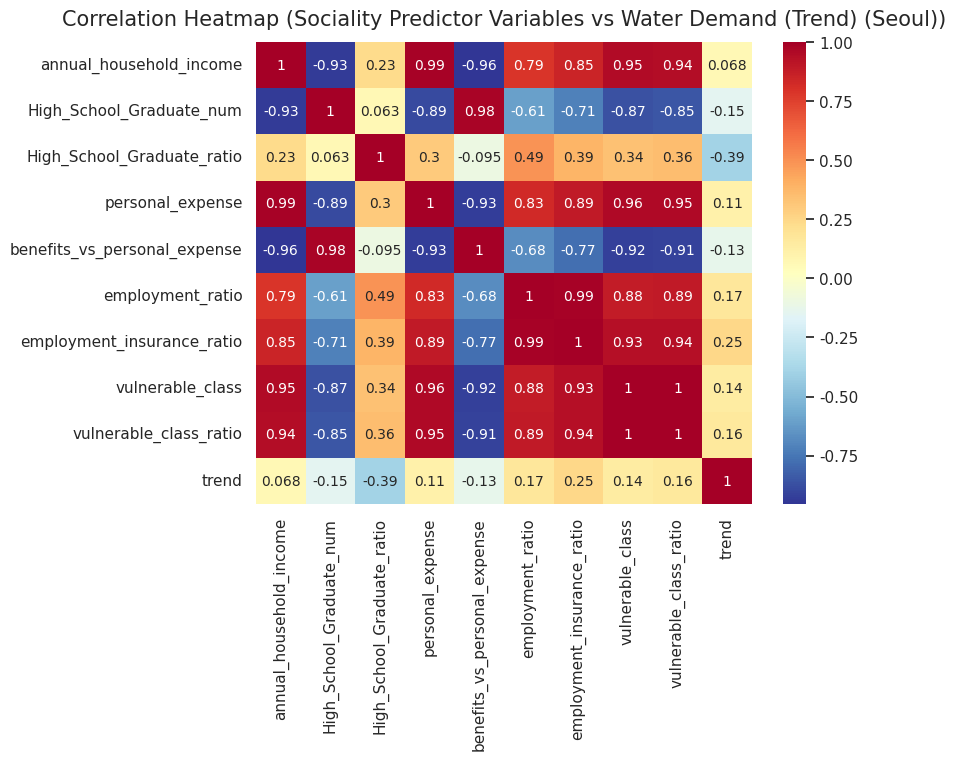

In [26]:
cols_sociality =['annual_household_income', 'High_School_Graduate_num', 'High_School_Graduate_ratio', 'personal_expense', 'benefits_vs_personal_expense', 
                 'employment_ratio', 'employment_insurance_ratio', 'vulnerable_class', 'vulnerable_class_ratio', 'trend']
plt.figure(figsize=(8, 6))
sns.set(font_scale = 1.0)
example3 = dataset[cols_sociality].loc["2017-07-01":"2021-06-01"]
heatmap = sns.heatmap(example3.corr(), cmap="RdYlBu_r", annot=True, annot_kws={"fontsize":10})
heatmap.set_title(f'Correlation Heatmap (Sociality Predictor Variables vs Water Demand (Trend) ({CITY_NAME_Eng}))', fontdict={'fontsize':15}, pad=12)
filename = CITY_NAME_Eng+"_sociality_predictor_vs_water_demand (sociality).png"
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.show()

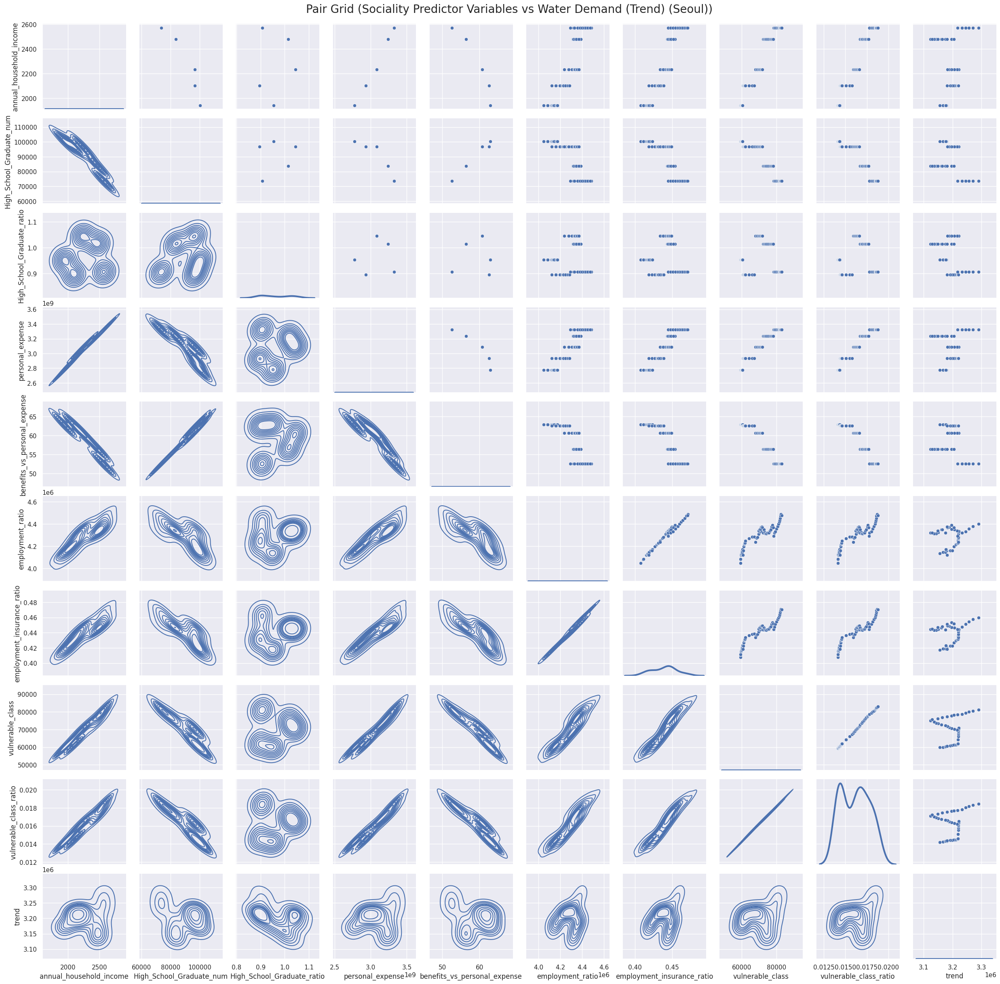

In [27]:
g = sns.PairGrid(dataset[cols_sociality])
g.fig.subplots_adjust(top=0.96)
g.fig.suptitle(f'Pair Grid (Sociality Predictor Variables vs Water Demand (Trend) ({CITY_NAME_Eng}))', fontsize=20)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False)
plt.savefig(f"./{folder_name}/" + CITY_NAME_Eng+"_sociality_predictor_vs_water_demand (sociality)_pair_grid.png", bbox_inches='tight')

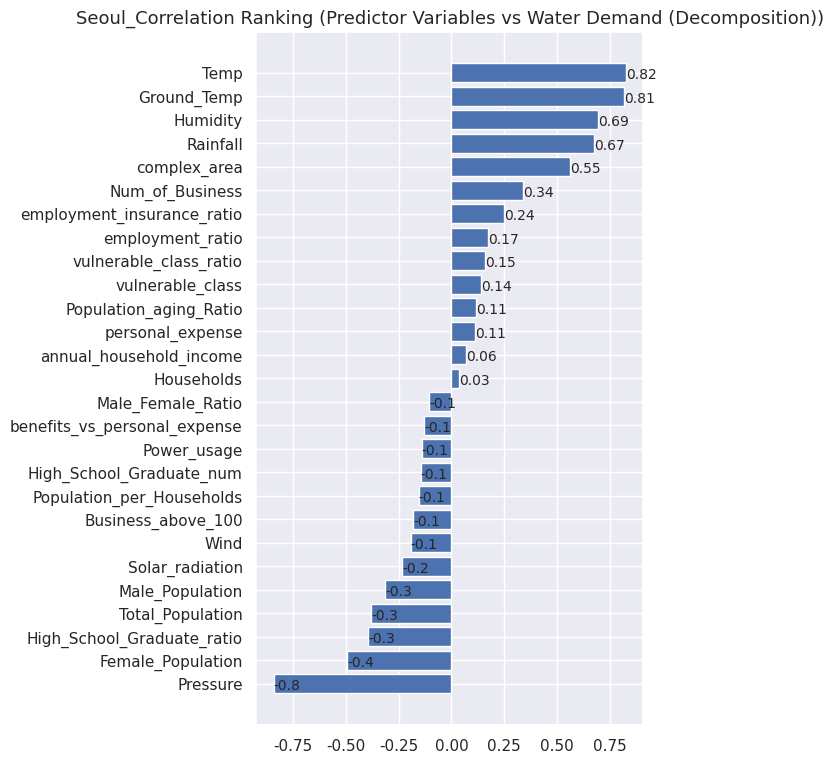

In [28]:
data_corr1 = pd.concat([dataset[cols_seasonality].corr()[-1:].T[:-1], example1.corr()[-1:].T[:-1], example3.corr()[-1:].T[:-1]])
data_corr1 = data_corr1.fillna(0)
data_corr1[f'{CITY_NAME_Eng}_Correlation_decomposition'] = data_corr1['trend'] + data_corr1['seasonal']
data_corr1 = data_corr1.drop(['trend', 'seasonal'], axis=1)
data_corr1.sort_values(by=f'{CITY_NAME_Eng}_Correlation_decomposition', ascending=True, inplace=True)
fig, ax = plt.subplots(figsize=(5,9))
ax.barh(data_corr1.index, data_corr1[f'{CITY_NAME_Eng}_Correlation_decomposition'].values)
for i, v in enumerate(data_corr1[f'{CITY_NAME_Eng}_Correlation_decomposition']):
    ax.text(v, i-0.25, str(v)[0:4], fontsize=10)
filename = CITY_NAME_Eng+"_Correlation Ranking (Predictor Variables vs Water Demand (Decomposition)).png"
plt.title(f'{filename.split(".")[0]}', fontsize=13)
plt.savefig(f"./{folder_name}/" + filename, bbox_inches='tight')
plt.show()    
data_corr1.to_csv(f"./{folder_name}/" + f'{filename.split(".")[0]}.csv')